In [1]:
import anndata
import scvelo as scv
import pandas as pd
import numpy as np
import matplotlib as plt
import cellrank as cr

In [2]:
adata = scv.read("/rugpfs/fs0/tavz_lab/scratch/amillet/07_06_2022_Alon/scVelo_metadata/unified_adapoe.h5ad")

  0%|          | 0/24750 [00:00<?, ?cell/s]

  0%|          | 0/24750 [00:00<?, ?cell/s]

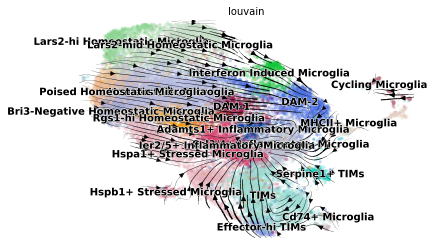

In [3]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata).compute_transition_matrix(n_jobs = 4)
vk.compute_projection(basis = "umap")
scv.pl.velocity_embedding_stream(adata, vkey = "T_fwd", basis = "umap")

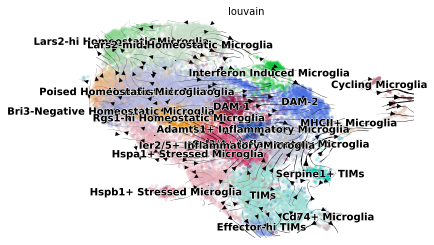

In [4]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()
ck.compute_projection(basis = "umap")
scv.pl.velocity_embedding_stream(adata, vkey = "T_fwd", basis = "umap")

  0%|          | 0/24750 [00:00<?, ?cell/s]

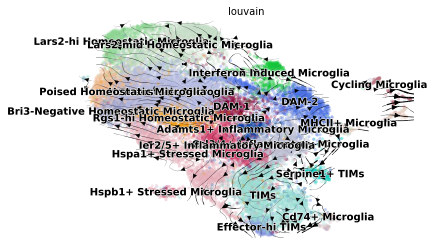

In [5]:
from cellrank.tl.kernels import PseudotimeKernel
pk = PseudotimeKernel(adata, time_key = "latent_time").compute_transition_matrix(n_jobs = 4)
pk.compute_projection(basis = "umap")
scv.pl.velocity_embedding_stream(adata, vkey = "T_fwd", basis = "umap")

  0%|          | 0/24750 [00:00<?, ?cell/s]

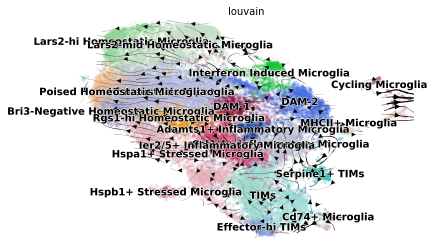

In [6]:
from cellrank.tl.kernels import CytoTRACEKernel
tk = CytoTRACEKernel(adata).compute_transition_matrix(n_jobs = 4)
tk.compute_projection(basis = "umap")
scv.pl.velocity_embedding_stream(adata, vkey = "T_fwd", basis = "umap")

In [ ]:
combined_kernel = 0.6*vk + 0.05*ck + 0.3*tk + 0.05*pk
# for 20wk/2yr unified: 0.02*vk + 0.9*ck + 0.04*tk + 0.04*pk
combined_kernel = combined_kernel.compute_transition_matrix(n_jobs = 4)
combined_kernel.compute_projection(basis = "umap")

saving figure to file ./figures/scvelo_stream.png


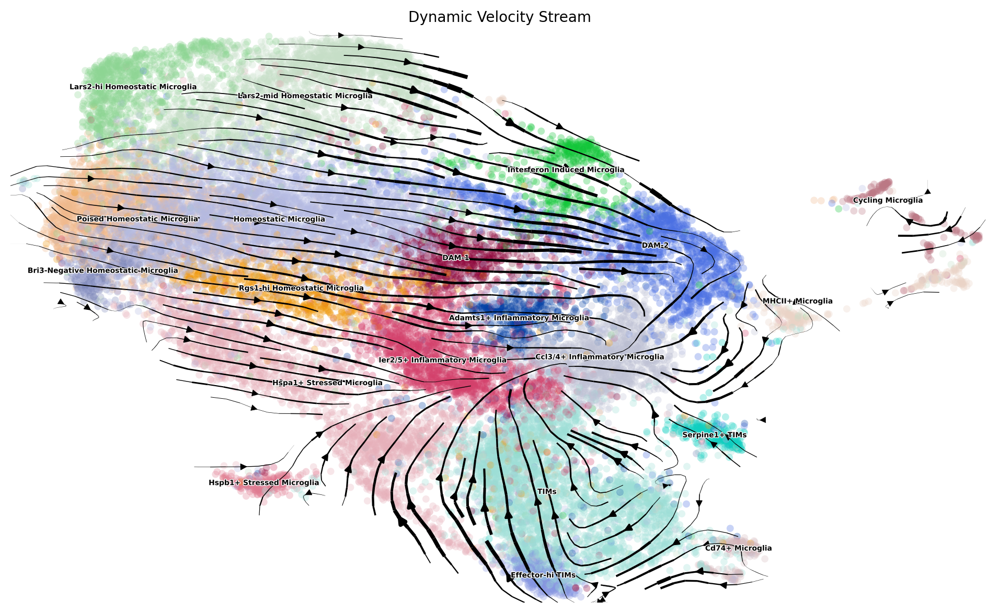

In [41]:
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.pl.velocity_embedding_stream(adata, basis = "umap", vkey = "T_fwd", figsize=(25,15), color = "louvain", save = "stream.png",
                                legend_fontsize = 5, legend_fontoutline = 1,
                                title = "Dynamic Velocity Stream",
                                fontsize = 10, linewidth = 2)

In [9]:
from cellrank.tl.estimators import GPCCA
g = GPCCA(combined_kernel)
print(g)

GPCCA[n=24750, kernel=((0.6 * <VelocityKernel[softmax_scale=8.68, mode=deterministic, seed=25859, scheme=<CorrelationScheme>]>) + (0.05 * <ConnectivityKernel[dnorm=True, key=connectivities]>) + (0.3 * <CytoTRACEKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.05 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>))]


Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000089e+00 -1.9653854756521792e-03 4.0427085510582174e-04 -6.9238406211548885e-03 6.4765463998401841e-03 4.8767088447715205e-03 -2.0573930505937074e-02 -2.1092374440839529e-02 -7.5523048804357791e-03 -1.6554894537979033e-03 
0.0000000000000000e+00 9.9856096314610143e-01 5.3039878195600392e-03 -6.2627445889067426e-03 -9.4178040110530093e-03 -6.3826506708431112e-03 -1.9240236362007525e-02 3.3053606512307085e-03 2.5444393438331606e-02 1.3675050957330910e-02 
0.0000000000000000e+00 0.0000000000000000e+00 9.8398521416282270e-01 6.0880093735879632e-04 -9.5294957907016611e-03 -4.0415840669027550e-03 9.4015159247779513e-03 3.0369841051066460e-03 6.6955487731649504e-03 4.2788688500316396e-03 
0.0000000000000000e+00 0.0000000000000000e+00 -1.1760840237886249e-02 9.8398521416282270e-01 -4.6214011811822990e-03 -5.8164173590172048e-03 -1.7813543657852492e-02 1.8964857110364022e-02 -1.4747567650319822e-02 -2.6024090097193234e-03 
0.00000000000

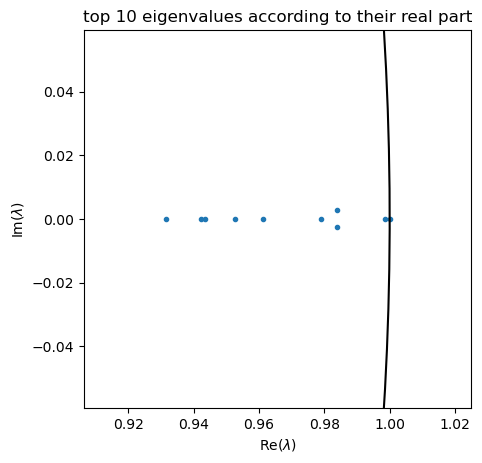

In [10]:
g.compute_schur(n_components = 10, method = "krylov")
g.plot_spectrum()

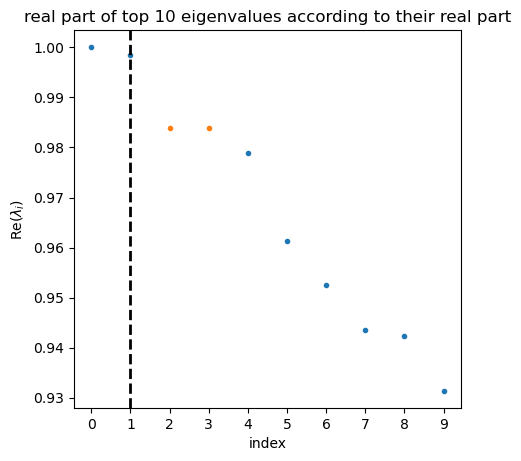

In [11]:
g.plot_spectrum(real_only=True)

In [22]:
g.compute_macrostates(n_states = 5, cluster_key = "louvain")

saving figure to file ./figures/scvelo_macrostates.png


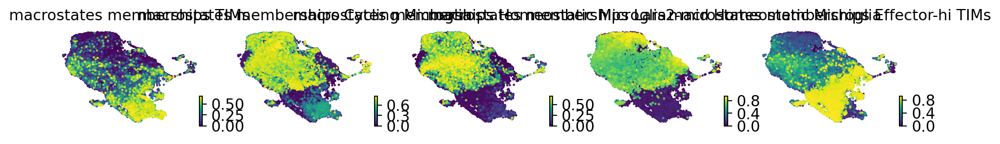

In [44]:
g.plot_macrostates(same_plot = False, save = "macrostates.png", figsize = (25,15))

In [24]:
g.compute_terminal_states()

In [25]:
g.compute_absorption_probabilities()

  0%|          | 0/5 [00:00<?, ?/s]

In [38]:
drivers = g.compute_lineage_drivers(lineages = ["TIMs"], return_drivers = True)

In [32]:
adata.var.loc[drivers.sort_values(by="TIMs_corr",ascending=False).index]["gene_name-0"].head(20)

gene_id
ENSMUSG00000027447.7         Cst3
ENSMUSG00000046748.9     Tmem45a2
ENSMUSG00000082329.2      Gm14287
ENSMUSG00000118444.2      Gm50477
ENSMUSG00000058715.12      Fcer1g
ENSMUSG00000037706.18        Cd81
ENSMUSG00000021423.7         Ly86
ENSMUSG00000030579.11      Tyrobp
ENSMUSG00000036905.9         C1qb
ENSMUSG00000023992.15       Trem2
ENSMUSG00000049775.17      Tmsb4x
ENSMUSG00000036887.6         C1qa
ENSMUSG00000030844.12       Rgs10
ENSMUSG00000022108.9        Itm2b
ENSMUSG00000038642.11        Ctss
ENSMUSG00000115288.2       Gm9212
ENSMUSG00000006519.12        Cyba
ENSMUSG00000007041.10       Clic1
ENSMUSG00000023010.16      Tmbim6
ENSMUSG00000007892.9        Rplp1
Name: gene_name-0, dtype: category
Categories (52328, object): ['', '5S_rRNA', '5_8S_rRNA', '7SK', ..., 'n-R5s185', 'n-R5s204', 'snoZ159', 'snoZ196']

In [33]:
cr.pl.circular_projection(adata, keys="louvain",legend_loc="right", dpi = 1500, save = "circular_projection.png",
                         lineages = ["TIMs","Homeostatic Microglia","Effector-hi TIMs"])

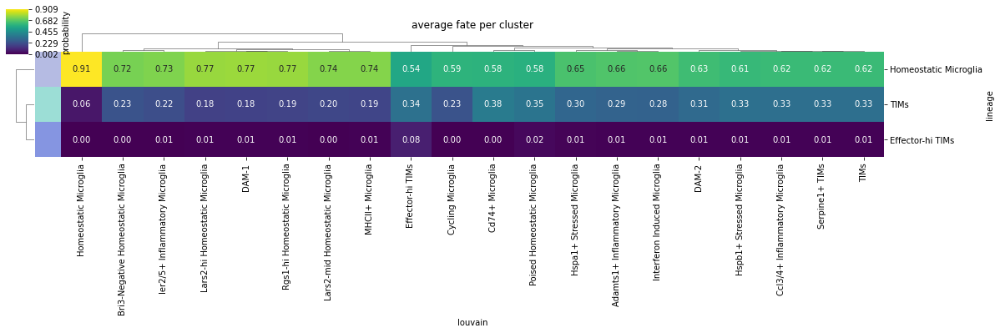

In [34]:
cr.pl.cluster_fates(adata, mode = "clustermap", cluster_key = "louvain",figsize = (15,5),
                    lineages = ["TIMs","Homeostatic Microglia","Effector-hi TIMs"], dpi = 1500, save = "clustermap.png")

In [35]:
cr.pl.cluster_fates(adata, mode = "violin", cluster_key = "louvain", figsize = (20,10),
                   lineages = ["TIMs","Homeostatic Microglia","Effector-hi TIMs"], dpi = 750, save = "vlnplot.png")

In [36]:
model = cr.ul.models.GAM(adata)

  0%|          | 0/20 [00:00<?, ?gene/s]

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

did not converge


/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/rugpfs/fs0/home/amillet/miniconda3/envs/scvelo/lib/python3.8/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the pr

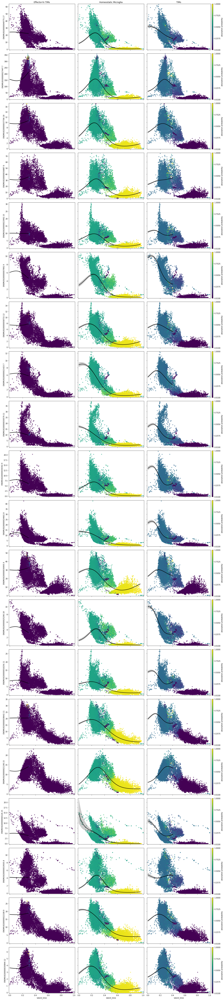

In [39]:
cr.pl.gene_trends(adata, model, drivers.sort_values(by="TIMs_corr",ascending=False).head(20).index, 
                  data_key = "Ms", time_key = "latent_time", 
                  lineages = ["TIMs","Homeostatic Microglia","Effector-hi TIMs"], conf_int = True,
                 save = "trends.png")

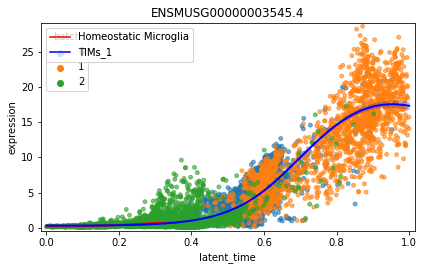

In [39]:
cr.pl.gene_trends(adata, model, "ENSMUSG00000003545.4", data_key = "Ms", time_key = "latent_time", 
                  lineages = ["TIMs","Homeostatic Microglia"], 
                  same_plot = True, cell_color = "batch", lineage_cmap = ["r","b"])